## Урок 4.
# Способы улучшения полученной модели.

**План занятия**

* [Теоретическая часть](#theory)
    * [Переобучение и способы борьбы с ним](#overfitting)
    * [Регуляризация](#regularization)
* [Практическая часть](#practice)
    * [Загрузка подготовленных датасетов](#data_loading)
    * [Модель, полученная на предыдущем уроке](#model_from_prev_lesson)
    * [Снижение степени переобучения](#lowering_overfitting)
    * [Подбор оптимального размера выборки, кривая обучения](#learning_curve)
    * [Выбор порога вероятности для определения класса](#threshold_calibration)
    * [Важность признаков](#feature_importances)  
    * [Финальная модель](#final_model)
    * [Сохранение финальной модели](#final_model_saving)

## <center>Теоретическая часть<a class="anchor" id="theory"></a><center>

### Переобучение и способы борьбы с ним<a class="anchor" id="overfitting"></a>

**Переобучение**

Нежелательное явление, возникающее при решении задач обучения по прецедентам, когда вероятность ошибки обученного алгоритма на объектах тестовой выборки оказывается существенно выше, чем средняя ошибка на обучающей выборке. Переобучение возникает при использовании избыточно сложных моделей.

<img src="overfitting.svg" alt="Drawing" style="width: 500px;">

**Способы борьбы с переобучением**

1. Обнаружить переобучение:
    * отложенная выборка
    * кросс-валидация
    * меры сложности модели
2. Взять больше данных
3. Выбрать более простую медель
4. Регуляризация

### Регуляризация<a class="anchor" id="regularization"></a>

Регуляризация - метод борьбы с переобучением, с помощью добавления некоторого штрафа за сложность модели.

<img src="bias.png" alt="Drawing" style="width: 500px;">

**L1-регуляризация** (lasso, регуляризация через манхэттенское расстояние)

$\large L_1 = \sum_{i=1} (y_i - \widehat{y_i})^2 + \lambda\sum_{j=1} |w_j|$

**L2-регуляризация** (ridge, регуляризация Тихонова)

$\large L_2 = \sum_{i=1} (y_i - \widehat{y_i})^2 + \lambda\sum_{j=1} w_j^2$

## <center>Практическая часть<a class="anchor" id="practice"></a><center>

**Подключение библиотек и скриптов**

In [103]:
import pandas as pd
import numpy as np
import pickle

from sklearn.model_selection import train_test_split, ShuffleSplit, cross_val_score, learning_curve
from sklearn.metrics import classification_report, f1_score, precision_score, recall_score
from sklearn.model_selection import KFold, GridSearchCV, RandomizedSearchCV
import xgboost as xgb
import catboost as catb

from sklearn.base import BaseEstimator, TransformerMixin

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.pipeline import FeatureUnion

from pandas_profiling import ProfileReport

import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline

In [104]:
def get_classification_report(y_train_true, y_train_pred, y_test_true, y_test_pred):
    print('TRAIN\n\n' + classification_report(y_train_true, y_train_pred))
    print('TEST\n\n' + classification_report(y_test_true, y_test_pred))
    print('CONFUSION MATRIX\n')
    print(pd.crosstab(y_test_true, y_test_pred))

In [105]:
def show_proba_calibration_plots(y_predicted_probs, y_true_labels):
    preds_with_true_labels = np.array(list(zip(y_predicted_probs, y_true_labels)))

    thresholds = []
    precisions = []
    recalls = []
    f1_scores = []

    for threshold in np.linspace(0.1, 0.9, 9):
        thresholds.append(threshold)
        precisions.append(precision_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))
        recalls.append(recall_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))
        f1_scores.append(f1_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))

    scores_table = pd.DataFrame({'f1':f1_scores,
                                 'precision':precisions,
                                 'recall':recalls,
                                 'probability':thresholds}).sort_values('f1', ascending=False).round(3)
  
    figure = plt.figure(figsize = (15, 5))

    plt1 = figure.add_subplot(121)
    plt1.plot(thresholds, precisions, label='Precision', linewidth=4)
    plt1.plot(thresholds, recalls, label='Recall', linewidth=4)
    plt1.plot(thresholds, f1_scores, label='F1', linewidth=4)
    plt1.set_ylabel('Scores')
    plt1.set_xlabel('Probability threshold')
    plt1.set_title('Probabilities threshold calibration')
    plt1.legend(bbox_to_anchor=(0.25, 0.25))   
    plt1.table(cellText = scores_table.values,
               colLabels = scores_table.columns, 
               colLoc = 'center', cellLoc = 'center', loc = 'bottom', bbox = [0, -1.3, 1, 1])

    plt2 = figure.add_subplot(122)
    plt2.hist(preds_with_true_labels[preds_with_true_labels[:, 1] == 0][:, 0], 
              label='Another class', color='royalblue', alpha=1)
    plt2.hist(preds_with_true_labels[preds_with_true_labels[:, 1] == 1][:, 0], 
              label='Main class', color='darkcyan', alpha=0.8)
    plt2.set_ylabel('Number of examples')
    plt2.set_xlabel('Probabilities')
    plt2.set_title('Probability histogram')
    plt2.legend(bbox_to_anchor=(1, 1))

    plt.show()

In [106]:
def show_learning_curve_plot(estimator, X, y, cv=3, n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 5)):

    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, 
                                                            cv=cv, 
                                                            scoring='f1',
                                                            train_sizes=train_sizes, 
                                                            n_jobs=n_jobs)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    plt.figure(figsize=(15,8))
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.title(f"Learning curves ({type(estimator).__name__})")
    plt.xlabel("Training examples")
    plt.ylabel("Score")     
    plt.legend(loc="best")
    plt.grid()
    plt.show()

In [107]:
def show_feature_importances(feature_names, feature_importances, get_top=None):
    feature_importances = pd.DataFrame({'feature': feature_names, 'importance': feature_importances})
    feature_importances = feature_importances.sort_values('importance', ascending=False)
       
    plt.figure(figsize = (20, len(feature_importances) * 0.355))
    
    sns.barplot(feature_importances['importance'], feature_importances['feature'])
    
    plt.xlabel('Importance')
    plt.title('Importance of features')
    plt.show()
    
    if get_top is not None:
        return feature_importances['feature'][:get_top].tolist()

In [108]:
class FeatureSelector(BaseEstimator, TransformerMixin):
    def __init__(self, column):
        self.column = column

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        return X[self.column]
    
class NumberSelector(BaseEstimator, TransformerMixin):
    """
    Transformer to select a single column from the data frame to perform additional transformations on
    Use on numeric columns in the data
    """
    def __init__(self, key):
        self.key = key

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return X[[self.key]]
    
class OHEEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, key):
        self.key = key
        self.columns = []

    def fit(self, X, y=None):
        self.columns = [col for col in pd.get_dummies(X, prefix=self.key).columns]
        return self

    def transform(self, X):
        X = pd.get_dummies(X, prefix=self.key)
        test_columns = [col for col in X.columns]
        for col_ in self.columns:
            if col_ not in test_columns:
                X[col_] = 0
        return X[self.columns]

**Пути к директориям и файлам**

In [109]:
# input
TRAIN_PATH = 'course_project_train.csv'
#TRAIN_PART_PATH = 'training_project_train_part_b.csv'
TEST_PATH = 'course_project_test.csv'

# output
MODEL_FILE_PATH = 'model.pkl'

### Загрузка подготовленных датасетов<a class="anchor" id="data_loading"></a>

**Загрузка данных**

In [110]:
#df = pd.read_csv(TRAIN_FULL_PATH)
df_train = pd.read_csv(TRAIN_PATH)
df_test = pd.read_csv(TEST_PATH)

In [111]:
profile = ProfileReport(df_train, title='Pandas Profiling Report', html={'style':{'full_width':True}})

In [112]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Пропуски данных:

#### 1. Months since last delinquent - более 50% данных отсутствует. Стратегия - удалить полностью этот признак.

#### 2. Annual Income - ок 21 %  данных  отсутствует. Стратегия - заполнить пропуски медианными значением

#### 3. Credit Scrore - ок 21 %  данных  отсутствует. Стратегия - заполнить пропуски медианными значением.



In [113]:
df_test.head()

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score
0,Rent,NaN,4 years,0.0,9.0,12.5,220968.0,0.0,70.0,0.0,debt consolidation,Short Term,162470.0,105906.0,6813.0,NaN
1,Rent,231838.0,1 year,0.0,6.0,32.7,55946.0,0.0,8.0,0.0,educational expenses,Short Term,78298.0,46037.0,2318.0,699.0
2,Home Mortgage,1152540.0,3 years,0.0,10.0,13.7,204600.0,0.0,NaN,0.0,debt consolidation,Short Term,200178.0,146490.0,18729.0,7260.0
3,Home Mortgage,1220313.0,10+ years,0.0,16.0,17.0,456302.0,0.0,70.0,0.0,debt consolidation,Short Term,217382.0,213199.0,27559.0,739.0
4,Home Mortgage,2340952.0,6 years,0.0,11.0,23.6,1207272.0,0.0,NaN,0.0,debt consolidation,Long Term,777634.0,425391.0,42605.0,706.0


In [114]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Home Ownership                2500 non-null   object 
 1   Annual Income                 1987 non-null   float64
 2   Years in current job          2414 non-null   object 
 3   Tax Liens                     2500 non-null   float64
 4   Number of Open Accounts       2500 non-null   float64
 5   Years of Credit History       2500 non-null   float64
 6   Maximum Open Credit           2500 non-null   float64
 7   Number of Credit Problems     2500 non-null   float64
 8   Months since last delinquent  1142 non-null   float64
 9   Bankruptcies                  2497 non-null   float64
 10  Purpose                       2500 non-null   object 
 11  Term                          2500 non-null   object 
 12  Current Loan Amount           2500 non-null   float64
 13  Cur

In [115]:
import re

In [116]:
df_train.columns

Index(['Home Ownership', 'Annual Income', 'Years in current job', 'Tax Liens',
       'Number of Open Accounts', 'Years of Credit History',
       'Maximum Open Credit', 'Number of Credit Problems',
       'Months since last delinquent', 'Bankruptcies', 'Purpose', 'Term',
       'Current Loan Amount', 'Current Credit Balance', 'Monthly Debt',
       'Credit Score', 'Credit Default'],
      dtype='object')

In [117]:
df_train_new= df_train.drop(['Months since last delinquent'], axis=1)
df_train_new['Annual Income'] = df_train_new['Annual Income'].fillna(df_train_new['Annual Income'].median())
df_train_new['Credit Score'] = df_train_new['Credit Score'].fillna(df_train_new['Credit Score'].median())
#df_train_new['Years in current job'] = df_train_new['Years in current job'].fillna(df_train_new['Years in current job'].mean())

In [118]:
df_train_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7500 entries, 0 to 7499
Data columns (total 16 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Home Ownership             7500 non-null   object 
 1   Annual Income              7500 non-null   float64
 2   Years in current job       7129 non-null   object 
 3   Tax Liens                  7500 non-null   float64
 4   Number of Open Accounts    7500 non-null   float64
 5   Years of Credit History    7500 non-null   float64
 6   Maximum Open Credit        7500 non-null   float64
 7   Number of Credit Problems  7500 non-null   float64
 8   Bankruptcies               7486 non-null   float64
 9   Purpose                    7500 non-null   object 
 10  Term                       7500 non-null   object 
 11  Current Loan Amount        7500 non-null   float64
 12  Current Credit Balance     7500 non-null   float64
 13  Monthly Debt               7500 non-null   float

In [119]:
df_train_new['Years in current job'].value_counts()

10+ years    2332
2 years       705
3 years       620
< 1 year      563
5 years       516
1 year        504
4 years       469
6 years       426
7 years       396
8 years       339
9 years       259
Name: Years in current job, dtype: int64

#### Колонки по индексу 2 и 8 все еще имеют пропуски. 



In [120]:
df_train_new.loc[:].isna().sum().sum()/df_train_new.shape[0]* 100 # кол-во строк содержащих NaN около 5 %, избавимся от них

5.133333333333334

In [121]:
df_train_new=df_train_new.dropna(axis=0)
df_train_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7115 entries, 1 to 7499
Data columns (total 16 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Home Ownership             7115 non-null   object 
 1   Annual Income              7115 non-null   float64
 2   Years in current job       7115 non-null   object 
 3   Tax Liens                  7115 non-null   float64
 4   Number of Open Accounts    7115 non-null   float64
 5   Years of Credit History    7115 non-null   float64
 6   Maximum Open Credit        7115 non-null   float64
 7   Number of Credit Problems  7115 non-null   float64
 8   Bankruptcies               7115 non-null   float64
 9   Purpose                    7115 non-null   object 
 10  Term                       7115 non-null   object 
 11  Current Loan Amount        7115 non-null   float64
 12  Current Credit Balance     7115 non-null   float64
 13  Monthly Debt               7115 non-null   float

In [122]:
TARGET_NAME = 'Credit Default'
NUM_FEATURE_NAMES =[col for col in df_train_new.iloc[: , :-1].columns if df_train_new[col].dtype!='O']
CAT_FEATURE_NAMES = [col for col in df_train_new.iloc[: , :-1].columns if df_train_new[col].dtype=='O']
SELECTED_FEATURE_NAMES = NUM_FEATURE_NAMES + CAT_FEATURE_NAMES

In [123]:
CAT_FEATURE_NAMES

['Home Ownership', 'Years in current job', 'Purpose', 'Term']

In [124]:
df_test_new= df_test.drop(['Months since last delinquent'], axis=1)
#df_train.columns
df_test_new['Annual Income'] = df_test_new['Annual Income'].fillna(df_test_new['Annual Income'].median())
df_test_new['Credit Score'] = df_test_new['Credit Score'].fillna(df_test_new['Credit Score'].median())
df_test_new=df_test_new.dropna(axis=0)

In [125]:
df_test_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2411 entries, 0 to 2499
Data columns (total 15 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Home Ownership             2411 non-null   object 
 1   Annual Income              2411 non-null   float64
 2   Years in current job       2411 non-null   object 
 3   Tax Liens                  2411 non-null   float64
 4   Number of Open Accounts    2411 non-null   float64
 5   Years of Credit History    2411 non-null   float64
 6   Maximum Open Credit        2411 non-null   float64
 7   Number of Credit Problems  2411 non-null   float64
 8   Bankruptcies               2411 non-null   float64
 9   Purpose                    2411 non-null   object 
 10  Term                       2411 non-null   object 
 11  Current Loan Amount        2411 non-null   float64
 12  Current Credit Balance     2411 non-null   float64
 13  Monthly Debt               2411 non-null   float

In [126]:
for colname in CAT_FEATURE_NAMES:
    df_train_new[colname] = pd.Categorical(df_train_new[colname])
    
df_train_new[CAT_FEATURE_NAMES].dtypes

Home Ownership          category
Years in current job    category
Purpose                 category
Term                    category
dtype: object

### Нормализация данных<a class="anchor" id="normalization"></a>

In [127]:
scaler = StandardScaler()

df_norm = df_train_new.copy()
df_norm[NUM_FEATURE_NAMES] = scaler.fit_transform(df_norm[NUM_FEATURE_NAMES])

df = df_norm.copy()

In [128]:
#from sklearn.preprocessing import OneHotEncoder
#ohe = OneHotEncoder()

In [129]:
#df_ohe=df.copy()
#df_ohe[CAT_FEATURE_NAMES].head()
#m=ohe.fit_transform(df_ohe['Home Ownership'])

### Разбиение на train и test<a class="anchor" id="train_and_test"></a>

In [130]:
X = df[SELECTED_FEATURE_NAMES]
y = df[TARGET_NAME]

X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, test_size=0.30, random_state=21)

In [133]:
final_transformers = list()

for cat_col in CAT_FEATURE_NAMES:
    cat_transformer = Pipeline([
                ('selector', FeatureSelector(column=cat_col)),
                ('ohe', OHEEncoder(key=cat_col))
            ])
    final_transformers.append((cat_col, cat_transformer))
    
for cont_col in NUM_FEATURE_NAMES:
    cont_transformer = Pipeline([
                ('selector', NumberSelector(key=cont_col)),
                ('scaler', StandardScaler())
            ])
    final_transformers.append((cont_col, cont_transformer))


In [134]:
feats = FeatureUnion(final_transformers)

feature_processing = Pipeline([('feats', feats)])

In [135]:
pipeline_1 = Pipeline([
    ('features',feats),
    ('classifier', catb.CatBoostClassifier(n_estimators=500, max_depth=3,
                                          silent=True, random_state=21)),
])

In [136]:
pipeline_2 = Pipeline([
    ('features',feats),
    ('classifier', catb.CatBoostClassifier(n_estimators=500, max_depth=3,
                                      l2_leaf_reg=10,
                                      silent=True, random_state=21)),
])

In [138]:
methods=['CatBoostClassifier_1','CatBoostClassifier_2']
pipeline_all=[pipeline_1,pipeline_2]
preds=[pr.fit(X_train, y_train).predict_proba(X_test)[:, 1] for pr in pipeline_all ]
pips={k:p for k,p in zip(methods, preds)}
for key, value in pips.items():
    print(key, ' : ', value[:10])

CatBoostClassifier_1  :  [0.40169861 0.20079358 0.27933519 0.98504961 0.2586174  0.30910259
 0.19689884 0.27769207 0.15046832 0.43000741]
CatBoostClassifier_2  :  [0.40460567 0.21416912 0.3050933  0.98324164 0.28390562 0.31463086
 0.19537307 0.26636442 0.1278861  0.40024547]


In [139]:
from sklearn.metrics import f1_score, roc_auc_score, precision_score, classification_report, precision_recall_curve, roc_curve, confusion_matrix
from sklearn.model_selection import cross_val_score, train_test_split

In [140]:
metrix=[]
names=['Threshold', 'F-Score', 'Precision', 'Recall']
for pp in pips.values():
    precision,recall,thresholds = precision_recall_curve(y_test, pp)
    fscore = (2 * precision * recall) / (precision + recall)
    # locate the index of the largest f score
    ix = np.argmax(fscore)
    m={k:v for k,v in zip(names,[thresholds[ix],fscore[ix],precision[ix],recall[ix]])}
    metrix.append(m)   
   
md={k:v for k, v in zip(methods,metrix)}

df=pd.DataFrame(md)
df

,CatBoostClassifier_1,CatBoostClassifier_2
Threshold,0.273025,0.274552
F-Score,0.563107,0.570028
Precision,0.491525,0.501232
Recall,0.659091,0.660714


In [142]:
y_train_pred = pipeline_1.predict(X_train)
y_test_pred = pipeline_1.predict(X_test)
y_test_pred_probs = pipeline_1.predict_proba(X_test)

get_classification_report(y_train, y_train_pred, y_test, y_test_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.80      0.99      0.88      3624
           1       0.92      0.34      0.50      1356

    accuracy                           0.81      4980
   macro avg       0.86      0.66      0.69      4980
weighted avg       0.83      0.81      0.78      4980

TEST

              precision    recall  f1-score   support

           0       0.77      0.97      0.86      1519
           1       0.80      0.26      0.40       616

    accuracy                           0.77      2135
   macro avg       0.78      0.62      0.63      2135
weighted avg       0.77      0.77      0.72      2135

CONFUSION MATRIX

col_0              0    1
Credit Default           
0               1477   42
1                453  163


### Модель, полученная на предыдущем уроке<a class="anchor" id="model_from_prev_lesson"></a>

### Снижение степени переобучения<a class="anchor" id="lowering_overfitting"></a>

In [144]:
#final_model = catb.CatBoostClassifier(n_estimators=500, max_depth=3,
                                      #l2_leaf_reg=10,
                                      #silent=True, random_state=21)
#final_model.fit(X_train, y_train)

y_train_pred = pipeline_2.predict(X_train)
y_test_pred = pipeline_2.predict(X_test)
y_test_pred_probs = pipeline_2.predict_proba(X_test)

get_classification_report(y_train, y_train_pred, y_test, y_test_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.79      0.99      0.88      3624
           1       0.91      0.31      0.46      1356

    accuracy                           0.80      4980
   macro avg       0.85      0.65      0.67      4980
weighted avg       0.82      0.80      0.76      4980

TEST

              precision    recall  f1-score   support

           0       0.76      0.98      0.86      1519
           1       0.83      0.25      0.39       616

    accuracy                           0.77      2135
   macro avg       0.80      0.62      0.62      2135
weighted avg       0.78      0.77      0.72      2135

CONFUSION MATRIX

col_0              0    1
Credit Default           
0               1487   32
1                459  157


### Подбор оптимального размера выборки, кривая обучения<a class="anchor" id="learning_curve"></a>

In [145]:
#final_model = catb.CatBoostClassifier(n_estimators=500, max_depth=3,
                                      #class_weights=[1, 3.5],
                                      #silent=True, random_state=21)
final_model= Pipeline([
        ('features',feats),
        ('classifier', catb.CatBoostClassifier(n_estimators=500, max_depth=3,
                                      class_weights=[1, 3.5],
                                      silent=True, random_state=21)),
])

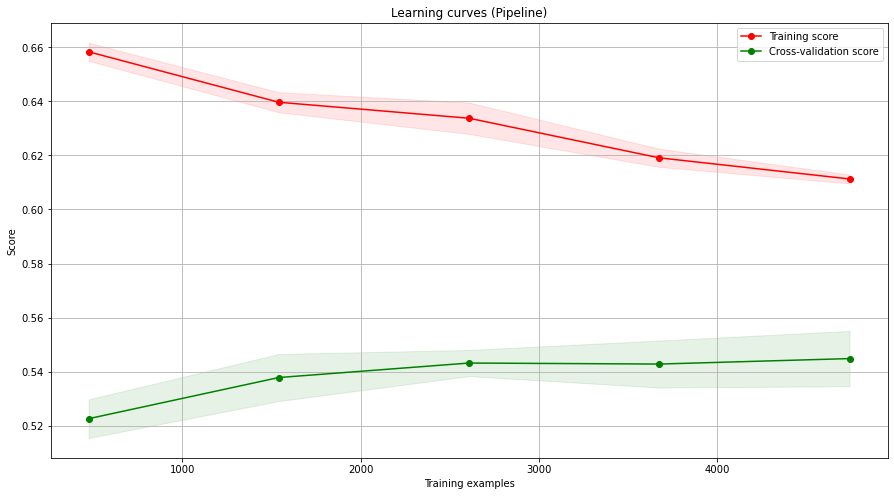

In [146]:
show_learning_curve_plot(final_model, X, y)

### Выбор порога вероятности для определения класса<a class="anchor" id="threshold_calibration"></a>

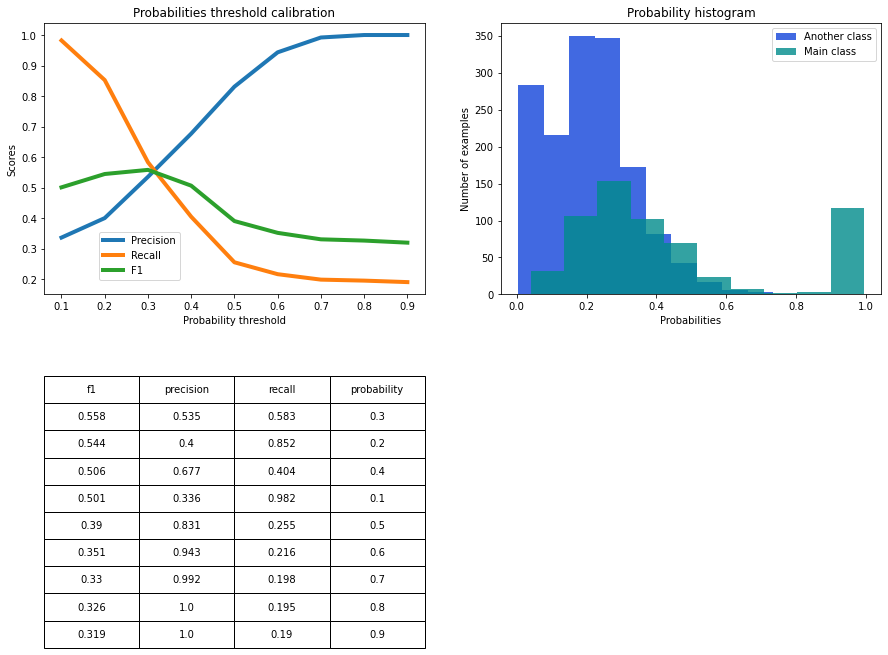

In [147]:
show_proba_calibration_plots(y_test_pred_probs[:, 1], y_test)

### Важность признаков<a class="anchor" id="feature_importances"></a>

In [148]:
important_features_top = show_feature_importances(X_train.columns, final_model.feature_importances_, get_top=15)

AttributeError: 'Pipeline' object has no attribute 'feature_importances_'

In [0]:
important_features_top

['PAY_1_2',
 'PAY_2_2',
 'LIMIT_BAL',
 'BILL_AMT1',
 'PAY_AMT2',
 'PAY_5_2',
 'BILL_AMT2',
 'PAY_AMT3',
 'PAY_3_2',
 'PAY_AMT1',
 'PAY_AMT4',
 'BILL_AMT3',
 'PAY_AMT6',
 'PAY_1_3',
 'PAY_AMT5']

### Финальная модель<a class="anchor" id="final_model"></a>

In [0]:
final_model = catb.CatBoostClassifier(n_estimators=500, max_depth=3, l2_leaf_reg=10,
                                      silent=True, random_state=21)
final_model.fit(X_train[important_features_top], y_train)

y_train_pred = final_model.predict(X_train[important_features_top])
y_test_pred = final_model.predict(X_test[important_features_top])
y_test_pred_probs = final_model.predict_proba(X_test[important_features_top])

get_classification_report(y_train, y_train_pred, y_test, y_test_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.72      0.84      0.78      5500
           1       0.76      0.61      0.67      4500

   micro avg       0.74      0.74      0.74     10000
   macro avg       0.74      0.72      0.73     10000
weighted avg       0.74      0.74      0.73     10000

TEST

              precision    recall  f1-score   support

           0       0.86      0.83      0.85      2305
           1       0.50      0.57      0.53       695

   micro avg       0.77      0.77      0.77      3000
   macro avg       0.68      0.70      0.69      3000
weighted avg       0.78      0.77      0.77      3000

CONFUSION MATRIX

col_0                0.0  1.0
NEXT_MONTH_DEFAULT           
0                   1907  398
1                    300  395


### Сохранение финальной модели<a class="anchor" id="final_model_saving"></a>

In [0]:
with open(MODEL_FILE_PATH, 'wb') as file:
    pickle.dump(final_model, file)